### Zillow Sales City YoY % Change

In [1]:
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt

from shapely.geometry import Point, Polygon
import geopandas as gpd
import pandas as pd
import numpy as np

In [2]:
# allow max rows and colums to be displayed
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)


In [3]:
geo = gpd.read_file('data/shapefiles/Zil_City_Reg.geojson')
geo.head()

,GEOID10,zip_id,Z_city,Z_state,Z_city_state,geometry
0,11563,11563.0,Lynbrook,NY,Lynbrook_NY,"MULTIPOLYGON (((-73.69078 40.65058, -73.69040 ..."
1,11560,11560.0,Locust Valley,NY,Locust Valley_NY,"MULTIPOLYGON (((-73.62102 40.89851, -73.61929 ..."
2,10701,10701.0,Yonkers,NY,Yonkers_NY,"MULTIPOLYGON (((-73.91127 40.91621, -73.91113 ..."
3,08512,8512.0,Cranbury Township,NJ,Cranbury Township_NJ,"MULTIPOLYGON (((-74.56841 40.28678, -74.56753 ..."
4,08742,8742.0,Point Pleasant,NJ,Point Pleasant_NJ,"MULTIPOLYGON (((-74.09518 40.09370, -74.09458 ..."


### Median List Price

In [4]:
df = pd.read_csv('data/Zil_Price_City.csv')

In [5]:
dates = df.columns.tolist()[1:]

In [6]:
cities = pd.merge(geo,df,how='left',left_on='Z_city_state',right_on='id')

In [7]:
cities = cities.drop(columns=['GEOID10', 'zip_id', 'Z_city_state','Z_city','Z_state'])
#cities.head()

In [8]:
cities = pd.melt(cities,id_vars=['id','geometry'],value_vars=dates)
cities.head()

,id,geometry,variable,value
0,Lynbrook_NY,"MULTIPOLYGON (((-73.69078 40.65058, -73.69040 ...",Jan_19,5.026663e+05
1,Locust Valley_NY,"MULTIPOLYGON (((-73.62102 40.89851, -73.61929 ...",Jan_19,2.063536e+06
2,Yonkers_NY,"MULTIPOLYGON (((-73.91127 40.91621, -73.91113 ...",Jan_19,4.699997e+05
3,Cranbury Township_NJ,"MULTIPOLYGON (((-74.56841 40.28678, -74.56753 ...",Jan_19,6.825768e+05
4,Point Pleasant_NJ,"MULTIPOLYGON (((-74.09518 40.09370, -74.09458 ...",Jan_19,6.096330e+05


In [9]:
#keep as many geos as possible and replace nans
cities.value = cities.value.fillna(0)

In [10]:
cities.describe()

,value
count,1.711200e+04
mean,5.974858e+05
std,5.072192e+05
min,0.000000e+00
25%,3.390333e+05
50%,4.719150e+05
75%,6.947250e+05
max,4.950000e+06


In [11]:
months = cities.variable.unique().tolist()

In [12]:
months

['Jan_19',
 'Feb_19',
 'Mar_19',
 'Apr_19',
 'May_19',
 'Jun_19',
 'Jul_19',
 'Aug_19',
 'Sep_19',
 'Oct_19',
 'Nov_19',
 'Dec_19',
 'Jan_20',
 'Feb_20',
 'Mar_20',
 'Apr_20',
 'May_20',
 'Jun_20',
 'Jul_20',
 'Aug_20',
 'Sep_20',
 'Oct_20',
 'Nov_20',
 'Dec_20']

In [16]:
def price_maps(gdf,month):
    fig, ax = plt.subplots(1, figsize = (20,16))
    ax.axis('off')
    new_norm = plt.Normalize(vmin=0,vmax=1000000)
    sm = plt.cm.ScalarMappable(cmap='Blues', norm=new_norm)
    sm.set_array([])
    fig.colorbar(sm)
    gdf.plot(column = 'value', cmap='Blues', norm=new_norm, edgecolor="face", linewidth=0.4, ax = ax)
    ax.set_title(f'Median Price {month[:3]} 20{month[-2:]}', color = 'k',  fontsize = 15)
   #             xy = (0.6,.05), xycoords = 'figure fraction', fontsize = 11, color = 'k')
    plt.savefig(f'Zillow/City_Price/{month}.jpg', dpi = 400) # saving each scatter plot by month

<ipython-input-16-6a09ae9bbe29>:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(1, figsize = (20,16))


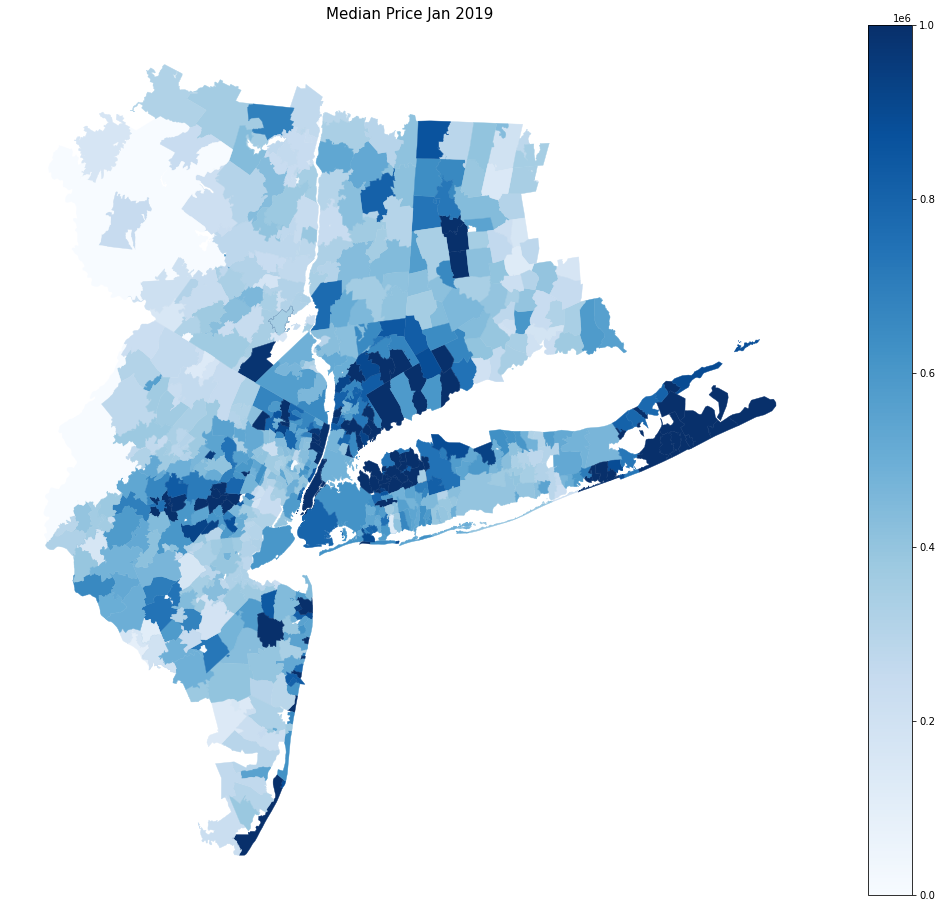

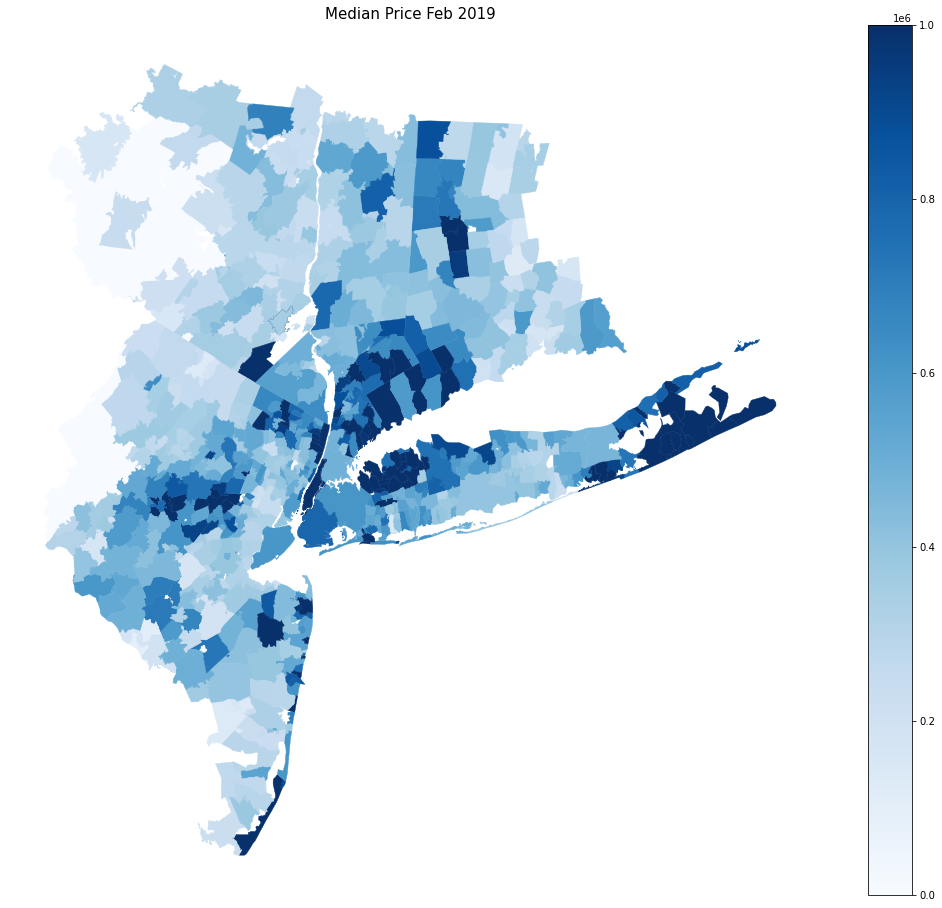

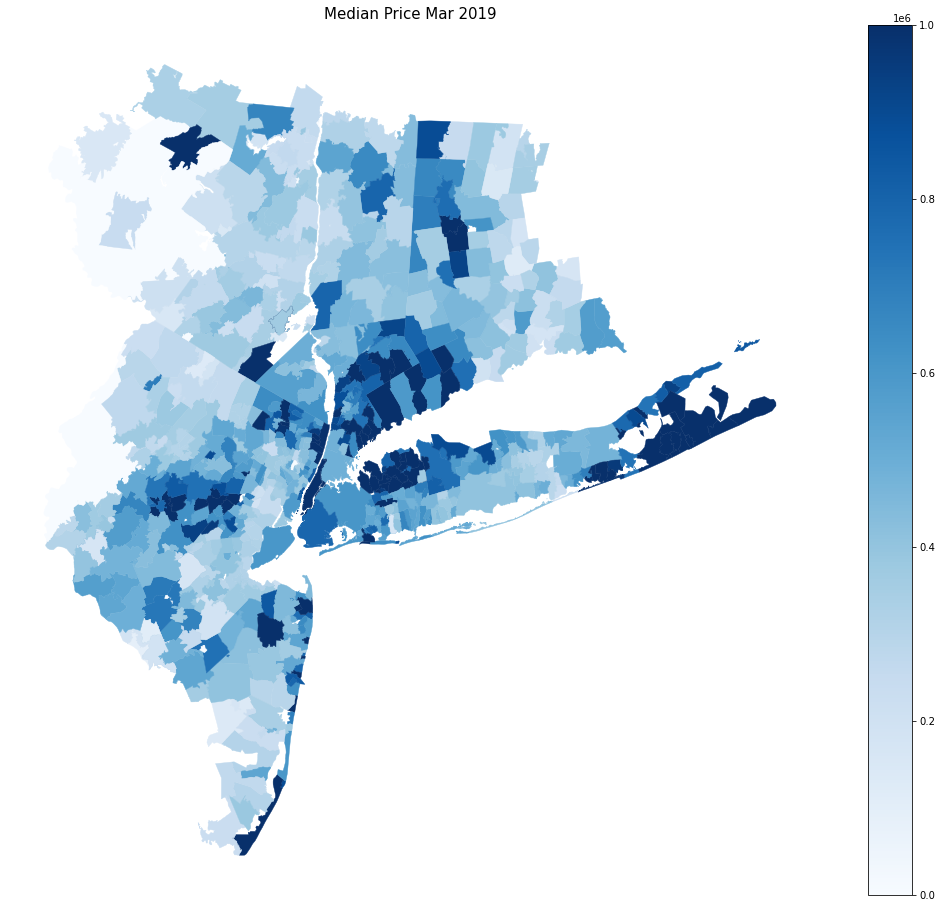

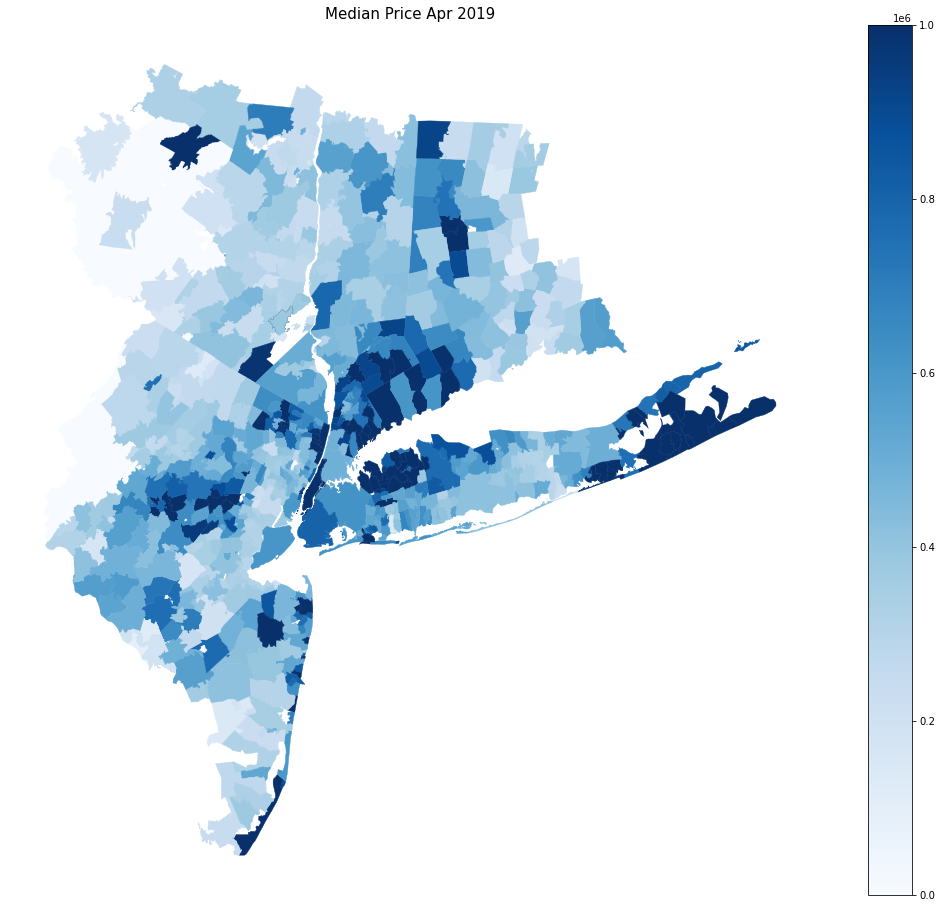

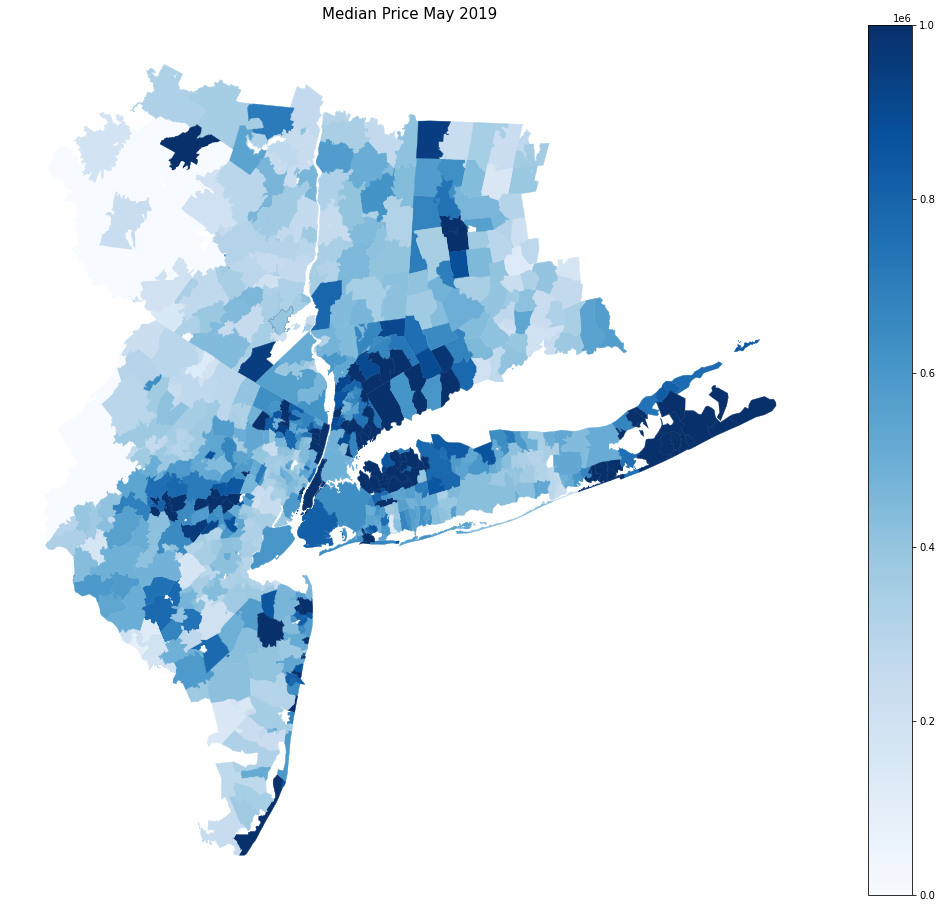

...

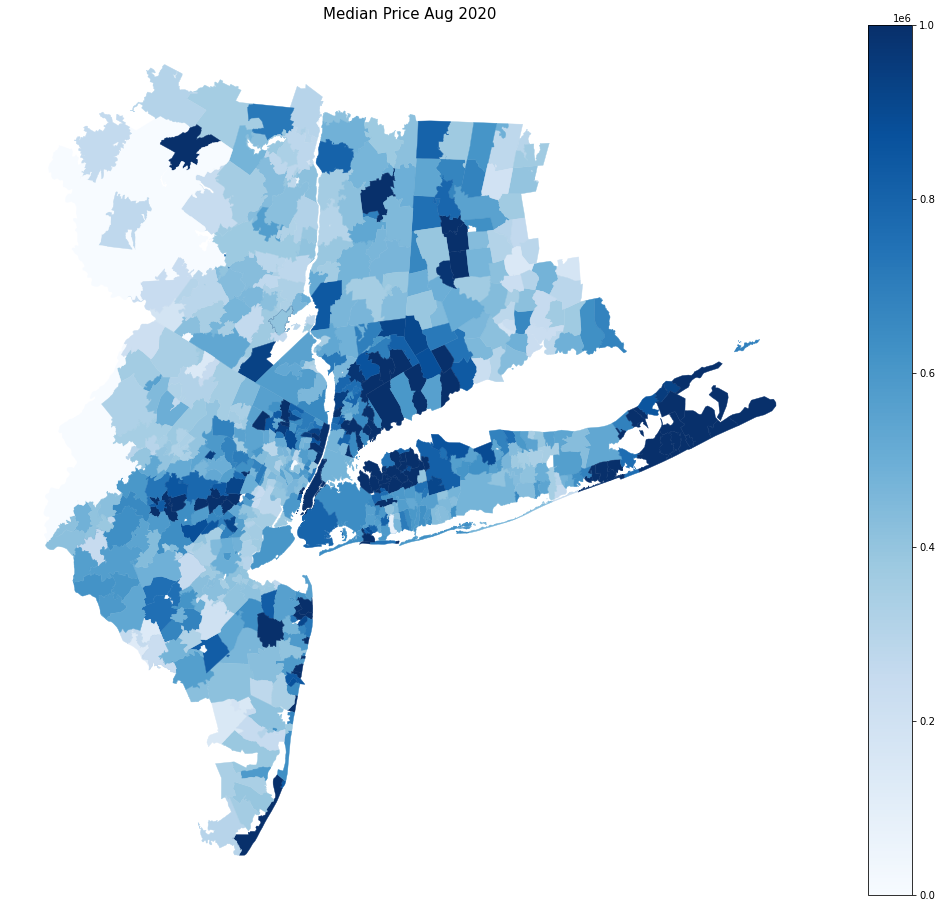

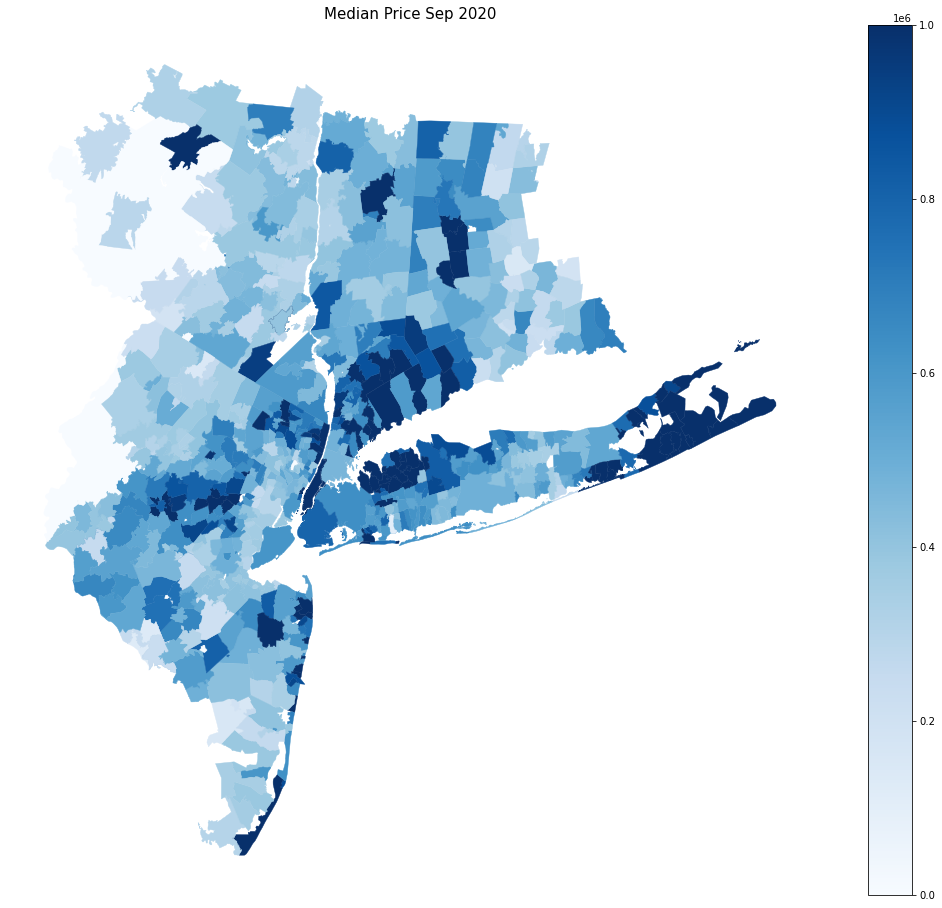

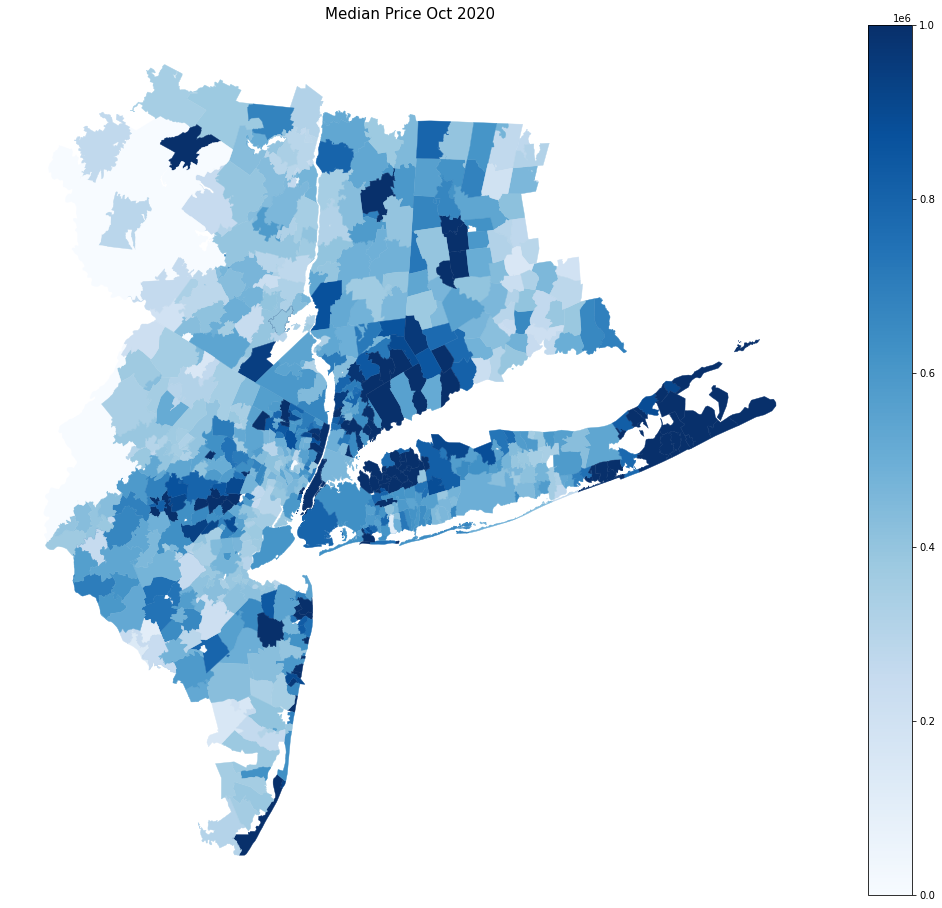

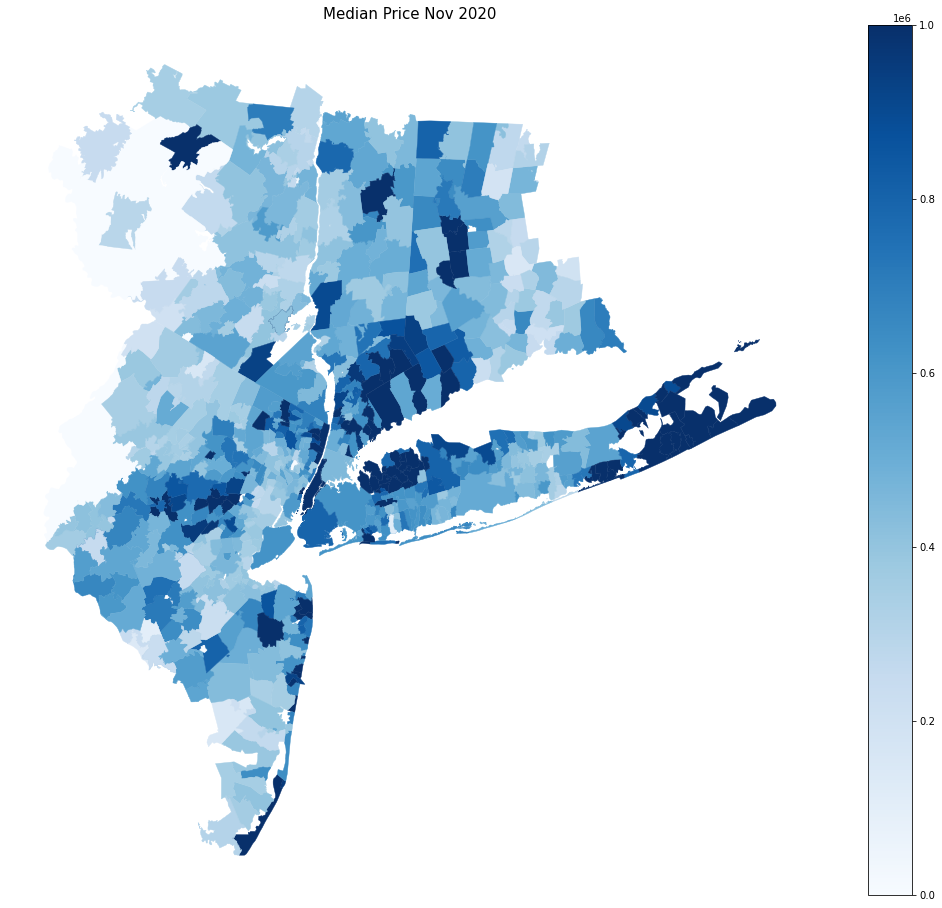

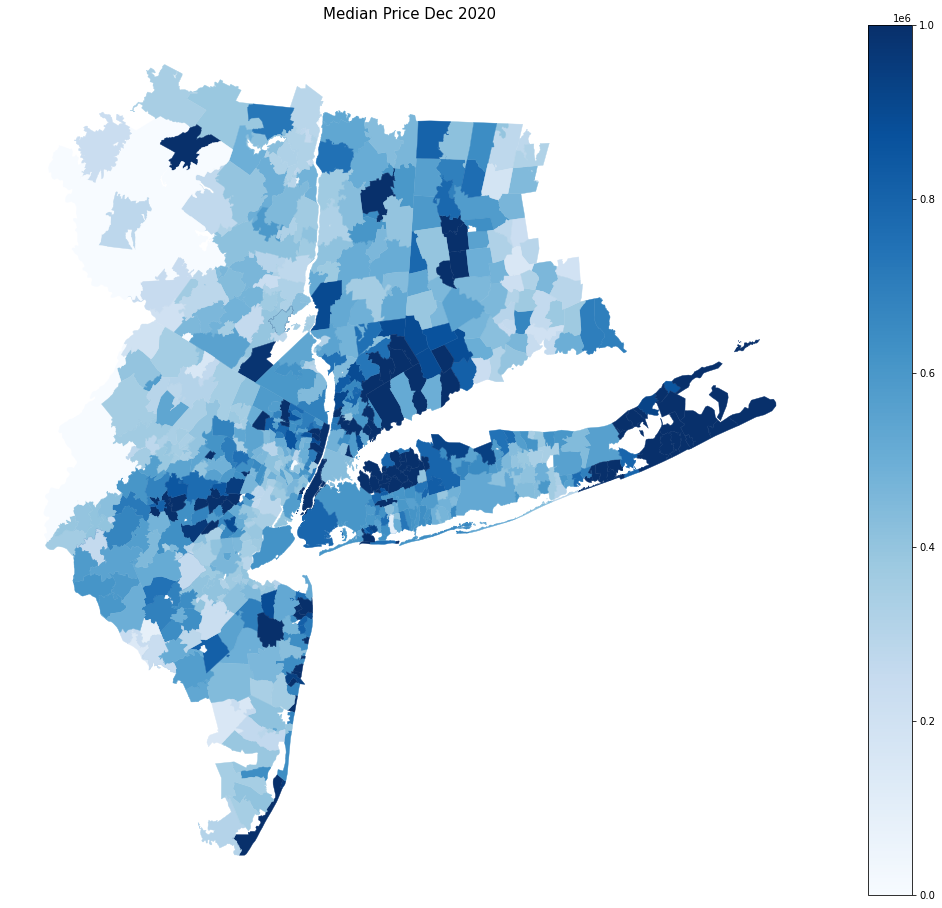

In [17]:
for m in months:
    gdf = cities[cities['variable'].isin([m])]
    price_maps(gdf,m)

### Price Change Maps

In [20]:
dff = pd.read_csv('data/Zil_Price_CityYoY.csv')

In [21]:
dates = dff.columns.tolist()[1:]

In [22]:
cities2 = pd.merge(geo,dff,how='left',left_on='Z_city_state',right_on='id')

In [23]:
cities2 = cities2.drop(columns=['GEOID10', 'zip_id', 'Z_city_state','Z_city','Z_state'])
#cities.head()

In [24]:
cities2 = pd.melt(cities2,id_vars=['id','geometry'],value_vars=dates)
cities2.head()

,id,geometry,variable,value
0,Lynbrook_NY,"MULTIPOLYGON (((-73.69078 40.65058, -73.69040 ...",Oct_19,0.037154
1,Locust Valley_NY,"MULTIPOLYGON (((-73.62102 40.89851, -73.61929 ...",Oct_19,0.067827
2,Yonkers_NY,"MULTIPOLYGON (((-73.91127 40.91621, -73.91113 ...",Oct_19,0.060016
3,Cranbury Township_NJ,"MULTIPOLYGON (((-74.56841 40.28678, -74.56753 ...",Oct_19,-0.132118
4,Point Pleasant_NJ,"MULTIPOLYGON (((-74.09518 40.09370, -74.09458 ...",Oct_19,0.066105


In [25]:
#keep as many geos as possible and replace nans
cities2.value = cities2.value.fillna(0)

In [26]:
cities2.describe()

,value
count,10695.000000
mean,0.063892
std,0.332795
min,-0.875918
25%,-0.012589
50%,0.038757
75%,0.113595
max,15.200760


In [30]:
months = cities2.variable.unique().tolist()
months

['Oct_19',
 'Nov_19',
 'Dec_19',
 'Jan_20',
 'Feb_20',
 'Mar_20',
 'Apr_20',
 'May_20',
 'Jun_20',
 'Jul_20',
 'Aug_20',
 'Sep_20',
 'Oct_20',
 'Nov_20',
 'Dec_20']

In [34]:
def yoyprice_maps(gdf,month):
    fig, ax = plt.subplots(1, figsize = (20,16))
    ax.axis('off')
    divnorm = mpl.colors.TwoSlopeNorm(vmin= -0.5, vcenter = 0,vmax = 0.5) # within a 95% accuracy one way or other
    sm = plt.cm.ScalarMappable(cmap='RdBu', norm=divnorm)
    sm.set_array([])
    gdf.plot(column = 'value', cmap = 'RdBu', edgecolor="face", norm = divnorm, linewidth=0.4, ax = ax)
    fig.colorbar(sm)
    ax.set_title(f'Y-o-Y % Change in Price {month[:3]} 20{month[-2:]}', color = 'k',  fontsize = 15)
   #             xy = (0.6,.05), xycoords = 'figure fraction', fontsize = 11, color = 'k')
    plt.savefig(f'Zillow/City_YoYPrice/{month}.jpg', dpi = 400) # saving each scatter plot by month

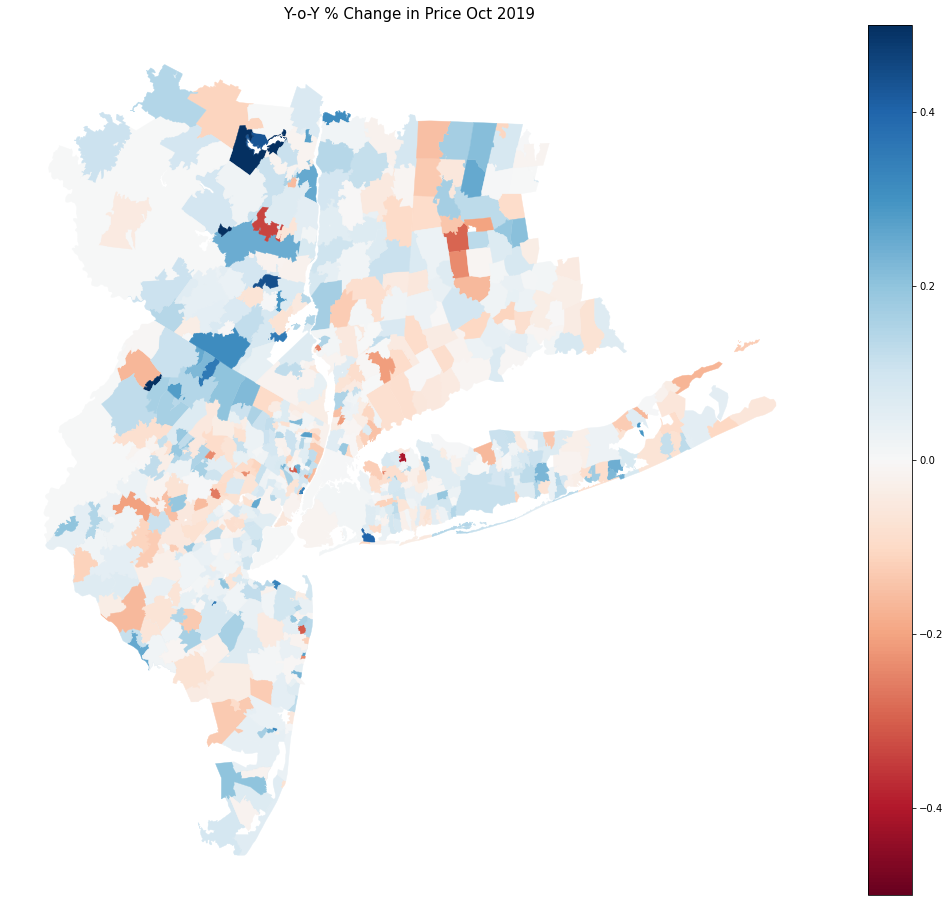

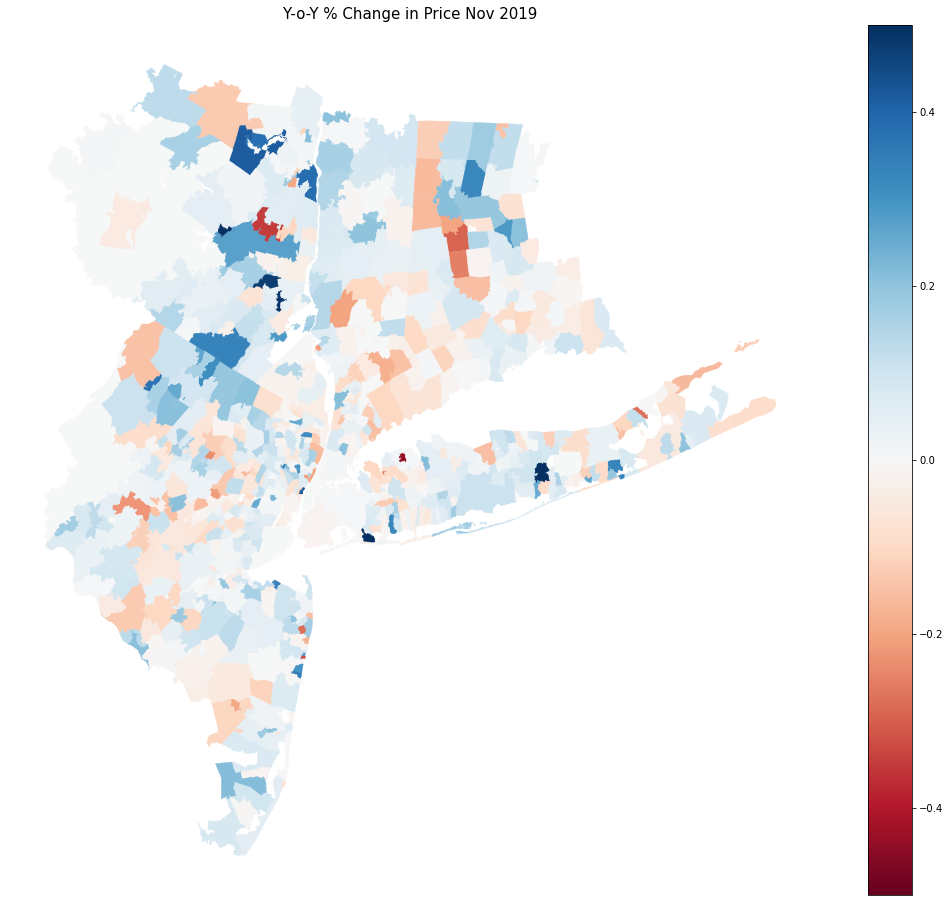

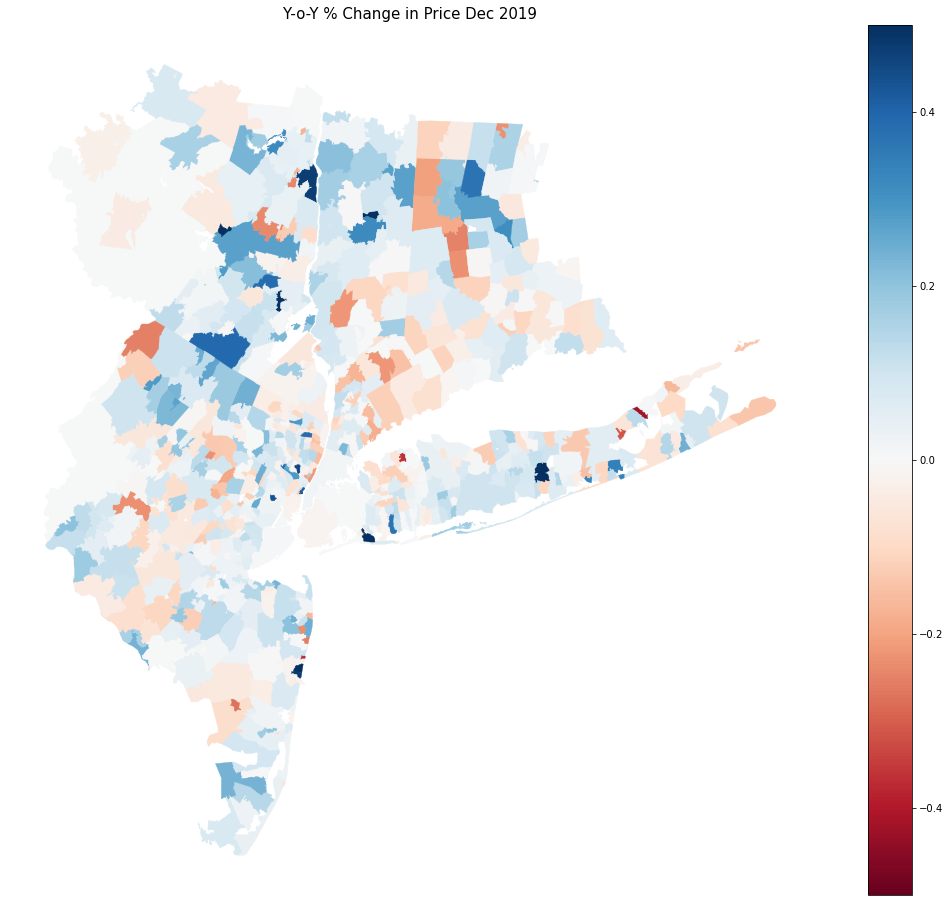

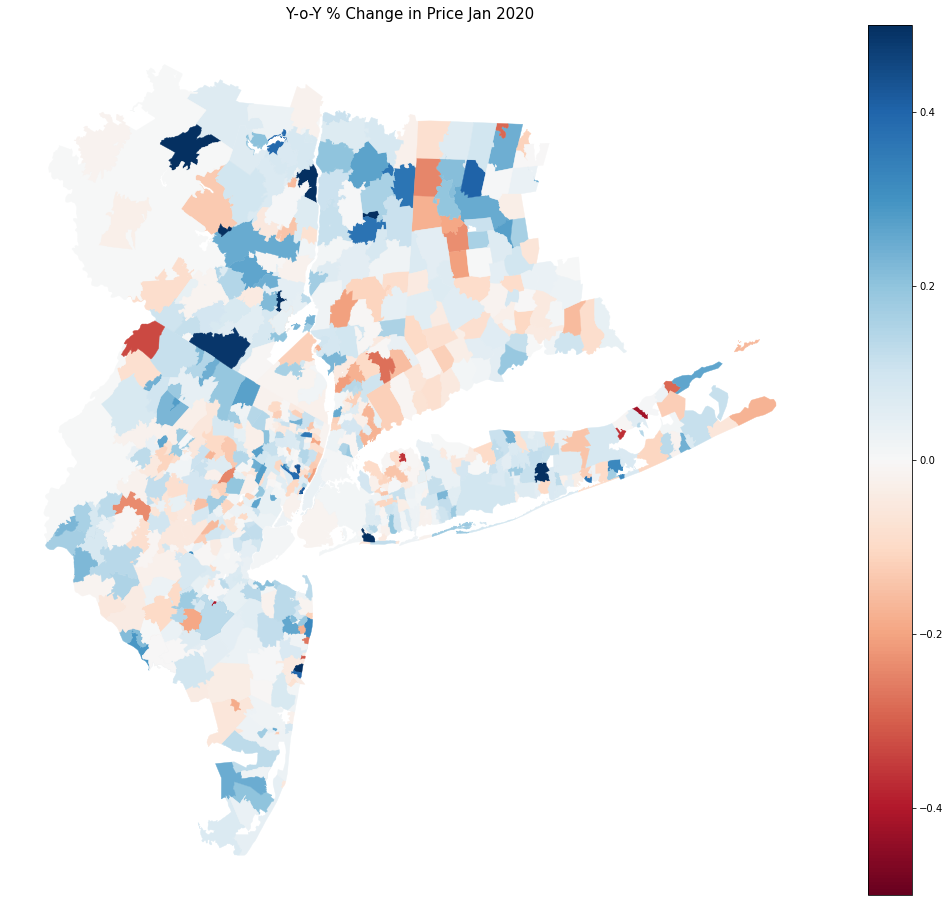

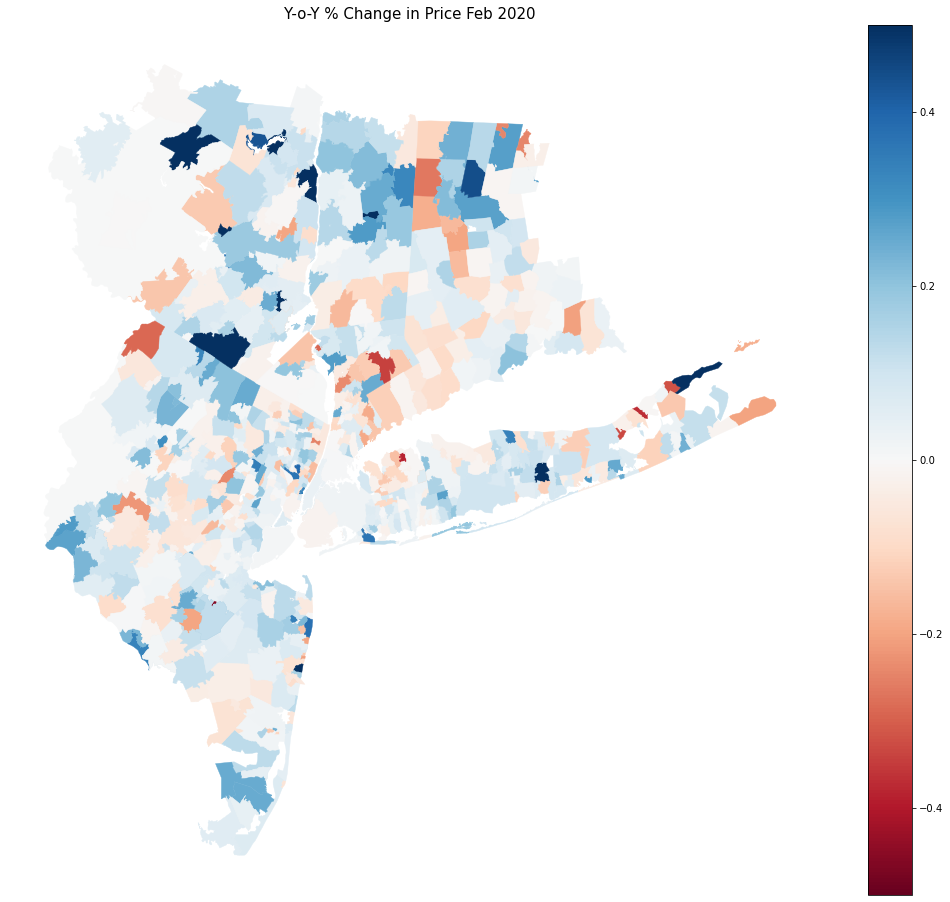

...

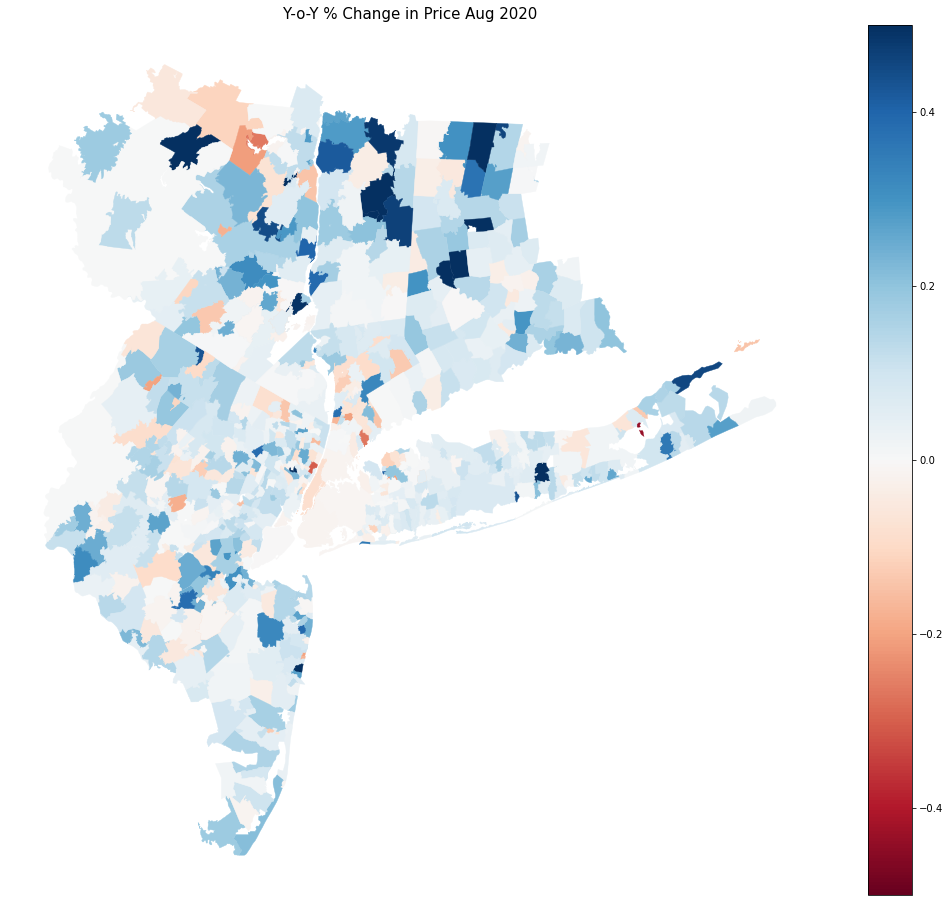

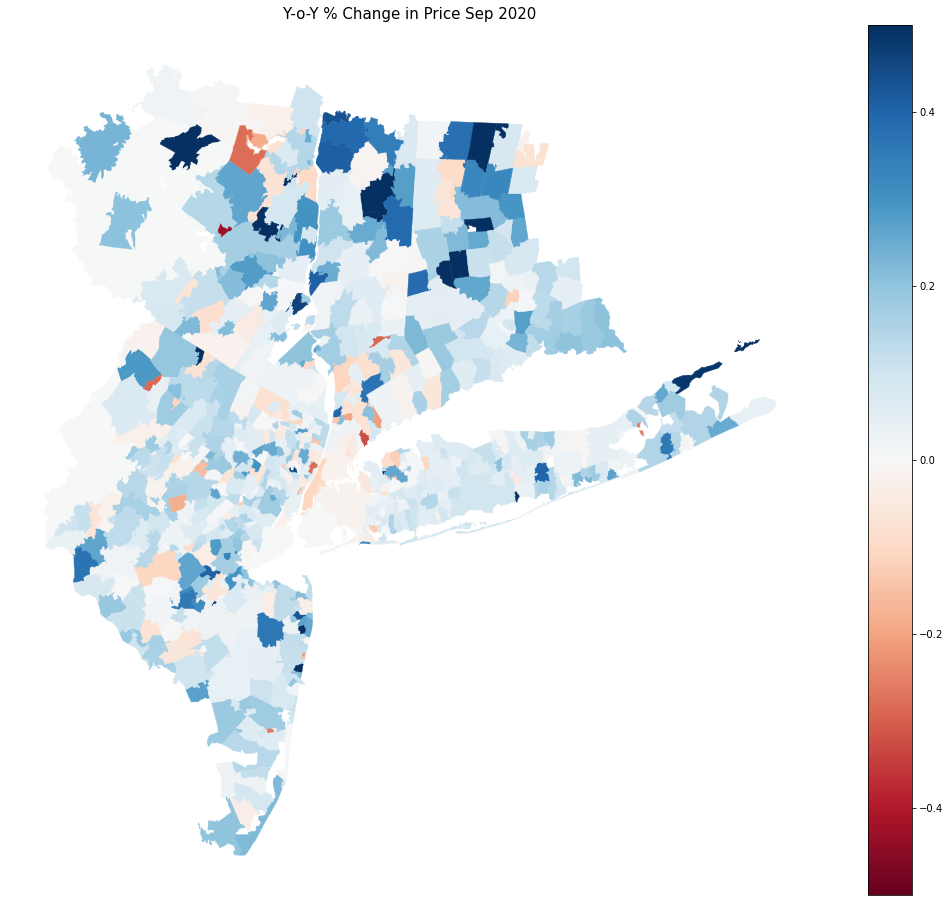

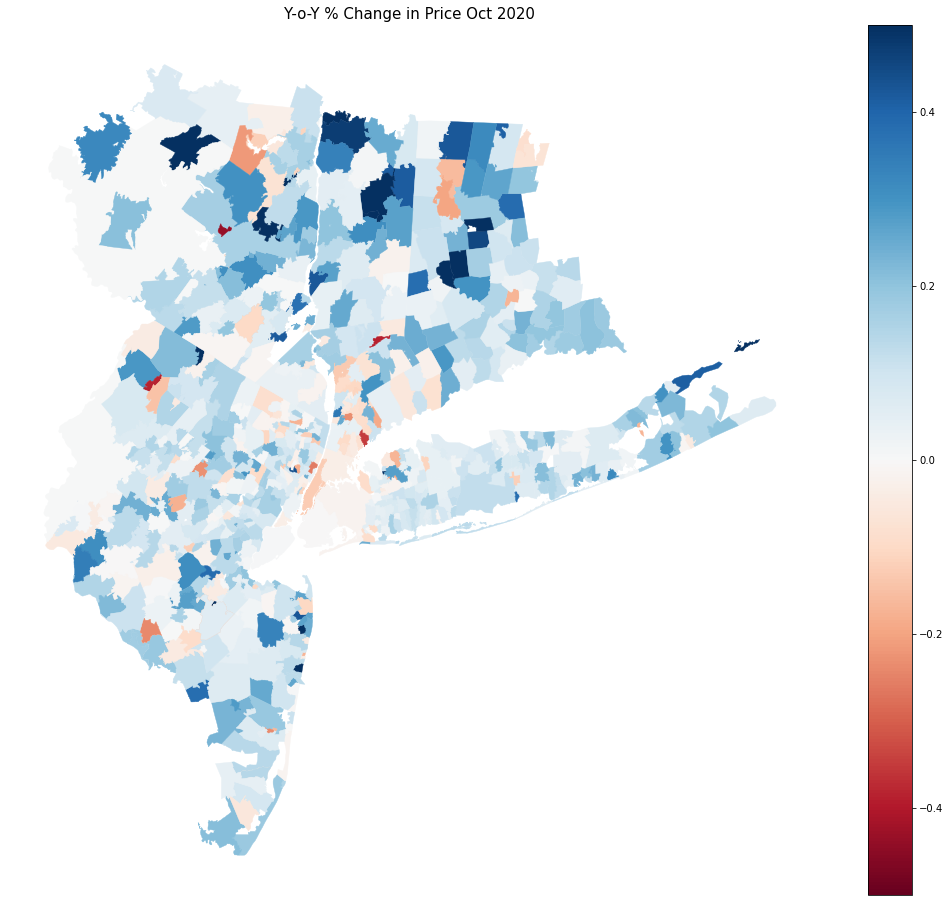

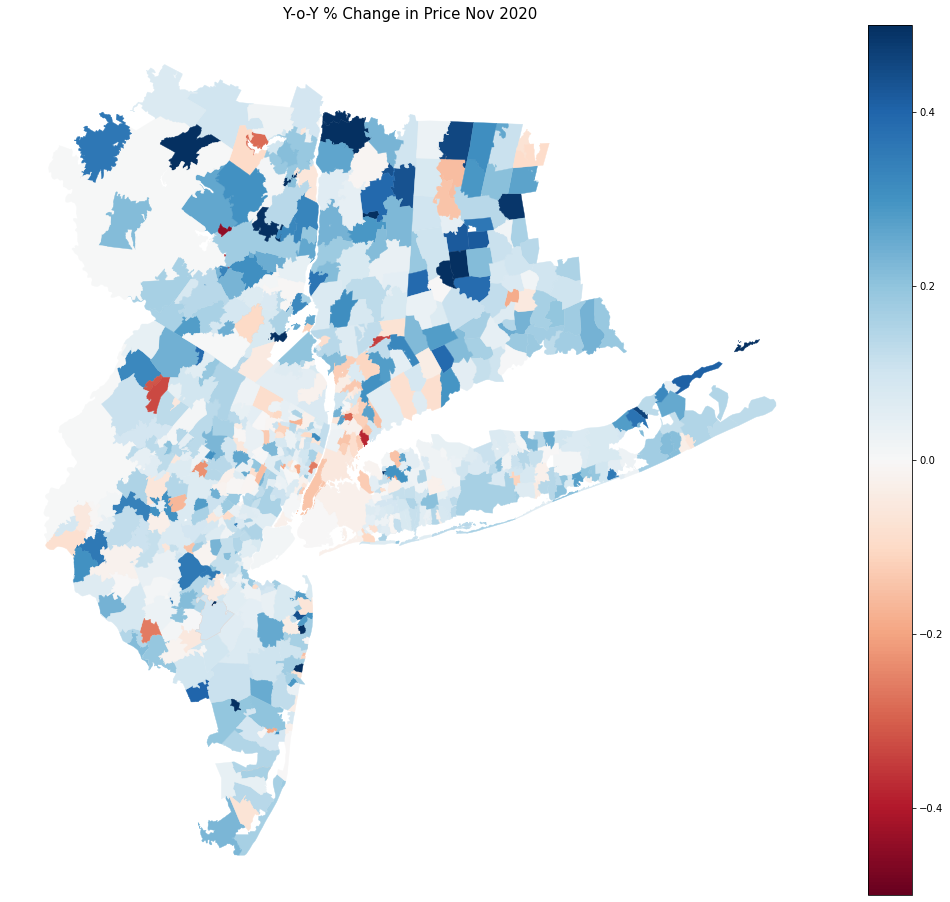

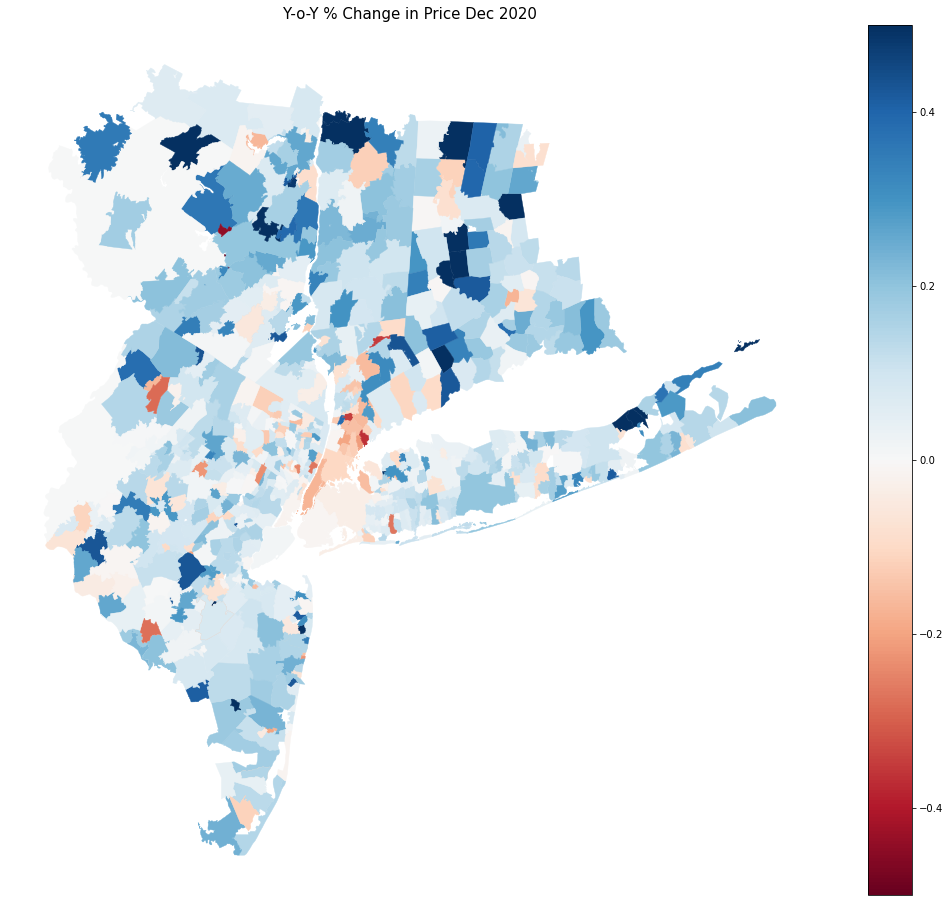

In [35]:
for m in months:
    gdf = cities2[cities2['variable'].isin([m])]
    yoyprice_maps(gdf,m)